# Assignment 3: Machine Learning Pipeline Improvement
Yanning Cui

In [65]:
import pandas as pd
import numpy as np
import glob
import calendar
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from sklearn.neighbors import KNeighborsRegressor
import pylab as pl

%matplotlib inline

from sklearn import preprocessing, cross_validation, svm, metrics, tree, decomposition, svm
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression, Perceptron, SGDClassifier, OrthogonalMatchingPursuit, RandomizedLogisticRegression
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cross_validation import train_test_split
from sklearn.grid_search import ParameterGrid
from sklearn.metrics import *
from sklearn.preprocessing import StandardScaler
import random
import pylab as pl
import matplotlib.pyplot as plt
from scipy import optimize
import time

### 1. Read Data: For this assignment, assume input is CSV and write a function that can read a csv into python

In [66]:
def read_data(filepath):
   "This function reads a csv file into Python"
   df = pd.read_csv(filepath)
   return df

In [67]:
raw_df = read_data("./data/credit-data.csv")
raw_df.head()

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,60644,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,60637,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,60601,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,60601,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,60625,1,0.024926,63588.0,7,0,1,0,0.0


### 2. Handling missing values

In [68]:
#function to print the number of missing values and what variables they belong to
def print_null_freq(df):
    """
    for a given DataFrame, calculates how many values for 
    each variable is null and prints the resulting table to stdout
    """
    df_lng = pd.melt(df)
    null_variables = df_lng.value.isnull()
    print(str(null_variables.sum()) + " values are missing")
    return pd.crosstab(df_lng.variable, null_variables)

#function to fill in missing values
def fillin_na(df, variable, kind):
    """
    for a variable in a given DataFrame, fill in missing values with zero, mean, or median
    """
    var = df[variable]
    if kind == 'zero':
        var = var.fillna(0)
    if kind == 'mean':
        var = var.fillna(var.mean())
    if kind == 'median':
        var = var.fillna(var.median())
    df[variable] = var 
    return df

#apply the two functions
print_null_freq(raw_df)

33655 values are missing


value,False,True
variable,,
DebtRatio,150000,0
MonthlyIncome,120269,29731
NumberOfDependents,146076,3924
NumberOfOpenCreditLinesAndLoans,150000,0
NumberOfTime30-59DaysPastDueNotWorse,150000,0
NumberOfTime60-89DaysPastDueNotWorse,150000,0
NumberOfTimes90DaysLate,150000,0
NumberRealEstateLoansOrLines,150000,0
PersonID,150000,0


In [69]:
fillin_na(raw_df, 'NumberOfDependents', 'zero')
fillin_na(raw_df, 'MonthlyIncome', 'median')
print_null_freq(raw_df) #check if missing values are all filled

0 values are missing


value,False
variable,
DebtRatio,150000
MonthlyIncome,150000
NumberOfDependents,150000
NumberOfOpenCreditLinesAndLoans,150000
NumberOfTime30-59DaysPastDueNotWorse,150000
NumberOfTime60-89DaysPastDueNotWorse,150000
NumberOfTimes90DaysLate,150000
NumberRealEstateLoansOrLines,150000
PersonID,150000


### 3. Explore Data: Distribution, Correlation, Important features

In [74]:
#visualize results
#function for distribution and correlation
def distribution(x,y,z):
    rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 20, 'legend.fontsize': 15.0, 'axes.titlesize': 30, "figure.figsize": [30, 12]}
    sns.set(rc=rc)
    g = sns.barplot(ci = None, x = raw_df[x], y = raw_df[y], hue = raw_df[z])
    plt.xticks(rotation=90)
    g.set(xlabel = x, ylabel = y, title = "Distribution")
    
def correlation(df):
    # Load the datset of correlations between cortical brain networks
    orrmat = df.corr()

# Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(12, 9))

# Draw the heatmap using seaborn
    sns.heatmap(corrmat, vmax=.8, square=True)
    

features = np.array(['RevolvingUtilizationOfUnsecuredLines',
       'age','NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio',
       'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans',
       'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines',
       'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents'])

prediction = ['SeriousDlqin2yrs']

def important_features(features,prediction):
    clf = RandomForestClassifier(n_estimators=10, criterion='gini')
    clf.fit(raw_df[features], raw_df[prediction])
# from the calculated importances, order them from most to least important
# and make a barplot so we can visualize what is/isn't important
    importances = clf.feature_importances_
    sorted_idx = np.argsort(importances)
    
    padding = np.arange(len(features)) + 0.5
    pl.barh(padding, importances[sorted_idx], align='center')
    pl.yticks(padding, features[sorted_idx])
    pl.xlabel("Relative Importance")
    pl.title("Variable Importance")
    pl.show()

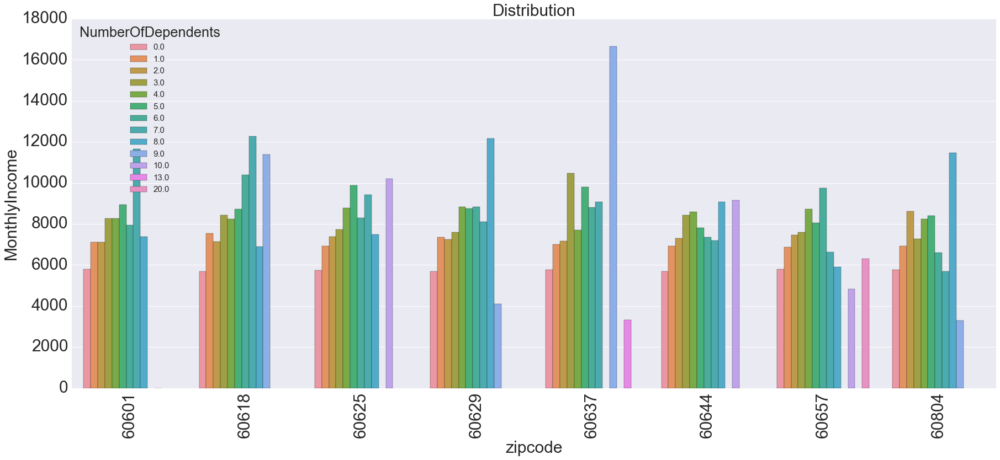

In [75]:
distribution("zipcode", 'MonthlyIncome', "NumberOfDependents")

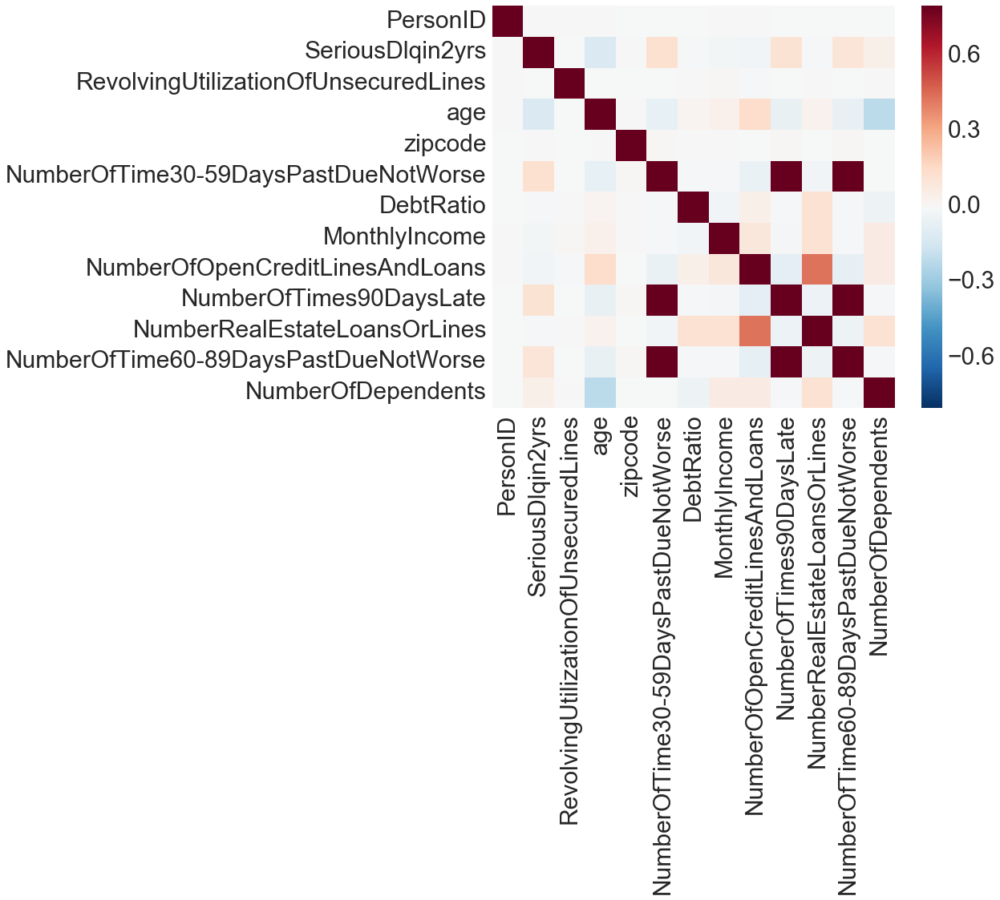

In [76]:
correlation(raw_df)

/Users/cuiyanning/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:31: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


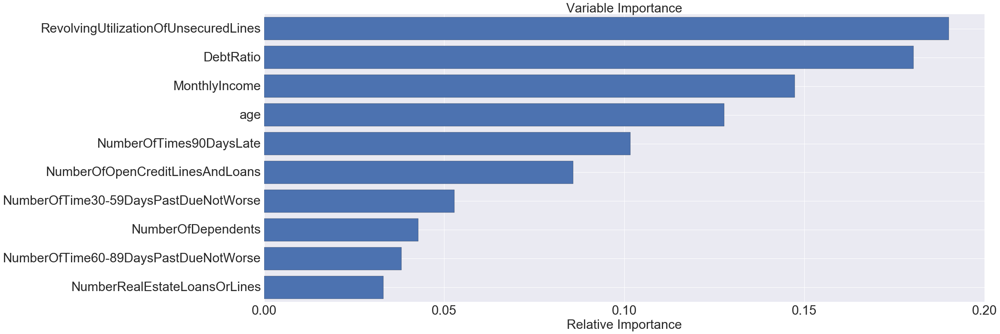

In [77]:
#apply the function
important_features(features, prediction)

### 4. Generate Features/Predictors: For this assignment, you should write one function that can discretize a continuous variable and one function that can take a categorical variable and create binary/dummy variables from it. Apply them to at least one variable each in this data.

In [78]:
#define a function to generate age groups
def agegroup(df):
    labels = [ "{0} - {1}".format(i, i + 9) for i in range(0, 110, 10) ]
    agegroup = pd.cut(df, range(0, 115, 10), right=False, labels=labels)
    return agegroup
#apply agegroup function
raw_df['agegroup'] = raw_df[['age']].apply(agegroup)
raw_df.head()

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,agegroup
0,1,1,0.766127,45,60644,2,0.802982,9120.0,13,0,6,0,2.0,40 - 49
1,2,0,0.957151,40,60637,0,0.121876,2600.0,4,0,0,0,1.0,40 - 49
2,3,0,0.658180,38,60601,1,0.085113,3042.0,2,1,0,0,0.0,30 - 39
3,4,0,0.233810,30,60601,0,0.036050,3300.0,5,0,0,0,0.0,30 - 39
4,5,0,0.907239,49,60625,1,0.024926,63588.0,7,0,1,0,0.0,40 - 49


In [79]:
pd.get_dummies(raw_df['NumberOfDependents'])

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,13.0,20.0
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 5. Build Classifier and Evaluation:

In [80]:
clfs = {'RF': RandomForestClassifier(n_estimators=50, n_jobs=-1),
        'ET': ExtraTreesClassifier(n_estimators=10, n_jobs=-1, criterion='entropy'),
        'AB': AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), algorithm="SAMME", n_estimators=200),
        'LR': LogisticRegression(penalty='l1', C=1e5),
        'SVM': svm.SVC(kernel='linear', probability=True, random_state=0),
        'GB': GradientBoostingClassifier(learning_rate=0.05, subsample=0.5, max_depth=6, n_estimators=10),
        'NB': GaussianNB(),
        'DT': DecisionTreeClassifier(),
        'SGD': SGDClassifier(loss="hinge", penalty="l2"),
        'KNN': KNeighborsClassifier(n_neighbors=3)
            }

small_grid = {
    'RF':{'n_estimators': [10,100], 'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10]},
    'LR': { 'penalty': ['l1','l2'], 'C': [0.1,1,10]},
    'SGD': { 'loss': ['hinge','log','perceptron'], 'penalty': ['l2','l1','elasticnet']},
    'ET': { 'n_estimators': [10,100], 'criterion' : ['gini', 'entropy'] ,'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10]},
    'AB': { 'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [100,1000]},
    'GB': {'n_estimators': [10,100], 'learning_rate' : [0.1,0.5],'subsample' : [0.5,1.0], 'max_depth': [5,50]},
    'NB' : {},
    'DT': {'criterion': ['gini', 'entropy'], 'max_depth': [20,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,5,10]},
    'SVM' :{'C' :[0.1,1,10],'kernel':['linear']},
    'KNN' :{'n_neighbors': [10,25],'weights': ['uniform','distance'],'algorithm': ['auto','ball_tree','kd_tree']}
           }

def generate_binary_at_k(y_scores, k):
    cutoff_index = int(len(y_scores) * (k / 100.0))
    test_predictions_binary = [1 if x < cutoff_index else 0 for x in range(len(y_scores))]
    return test_predictions_binary

def precision_at_k(y_true, y_scores, k):
    preds_at_k = generate_binary_at_k(y_scores, k)
    #precision, _, _, _ = metrics.precision_recall_fscore_support(y_true, preds_at_k)
    #precision = precision[1]  # only interested in precision for label 1
    precision = precision_score(y_true, preds_at_k)
    return precision

def plot_precision_recall_n(y_true, y_prob, model_name):
    from sklearn.metrics import precision_recall_curve
    y_score = y_prob
    precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_true, y_score)
    precision_curve = precision_curve[:-1]
    recall_curve = recall_curve[:-1]
    pct_above_per_thresh = []
    number_scored = len(y_score)
    for value in pr_thresholds:
        num_above_thresh = len(y_score[y_score>=value])
        pct_above_thresh = num_above_thresh / float(number_scored)
        pct_above_per_thresh.append(pct_above_thresh)
    pct_above_per_thresh = np.array(pct_above_per_thresh)

    plt.clf()
    fig, ax1 = plt.subplots()
    ax1.plot(pct_above_per_thresh, precision_curve, 'b')
    ax1.set_xlabel('percent of population')
    ax1.set_ylabel('precision', color='b')
    ax2 = ax1.twinx()
    ax2.plot(pct_above_per_thresh, recall_curve, 'r')
    ax2.set_ylabel('recall', color='r')
    ax1.set_ylim([0,1])
    ax1.set_ylim([0,1])
    ax2.set_xlim([0,1])

    name = model_name
    plt.title(name)
    #plt.savefig(name)
    plt.show()

def clf_loop(models_to_run, clfs, grid, X, y):
    results_df =  pd.DataFrame(columns=('model_type','clf', 'parameters', 'auc-roc','p_at_5', 'p_at_10', 'p_at_20'))
    for n in range(1, 2):
        # create training and valdation sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
        for index,clf in enumerate([clfs[x] for x in models_to_run]):
            #print (models_to_run[index])
            parameter_values = grid[models_to_run[index]]
            for p in ParameterGrid(parameter_values):
                #try:
                    clf.set_params(**p)
                    y_pred_probs = clf.fit(X_train, y_train).predict_proba(X_test)[:,1]
                    # you can also store the model, feature importances, and prediction scores
                    # we're only storing the metrics for now
                    y_pred_probs_sorted, y_test_sorted = zip(*sorted(zip(y_pred_probs, y_test), reverse=True))
                    results_df.loc[len(results_df)] = [models_to_run[index],clf, p,
                                                       roc_auc_score(y_test, y_pred_probs),
                                                       precision_at_k(y_test_sorted,y_pred_probs_sorted,5.0),
                                                       precision_at_k(y_test_sorted,y_pred_probs_sorted,10.0),
                                                       precision_at_k(y_test_sorted,y_pred_probs_sorted,20.0)]
                    
                    plot_precision_recall_n(y_test,y_pred_probs,clf)
                    
                #except IndexError, e:
                    #print ('Error:',e)
                    #continue
    return results_df


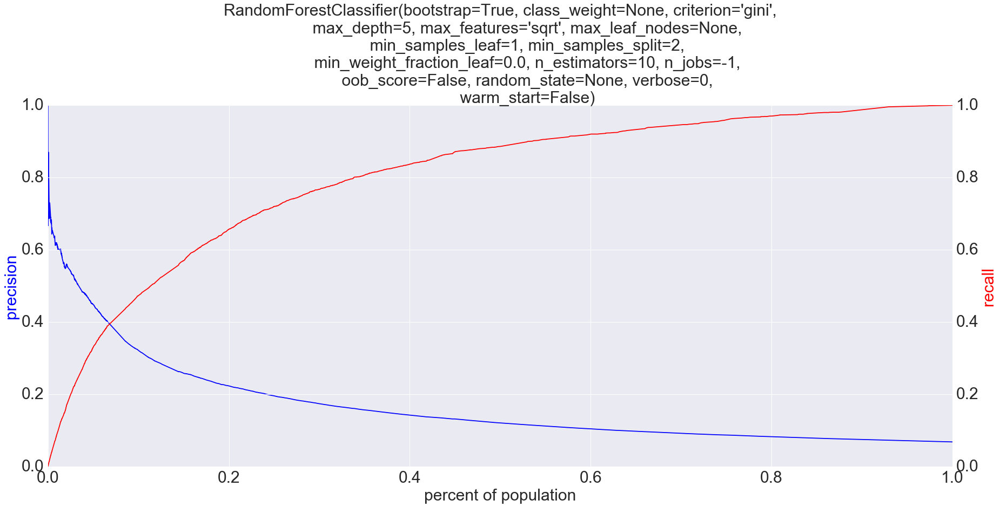

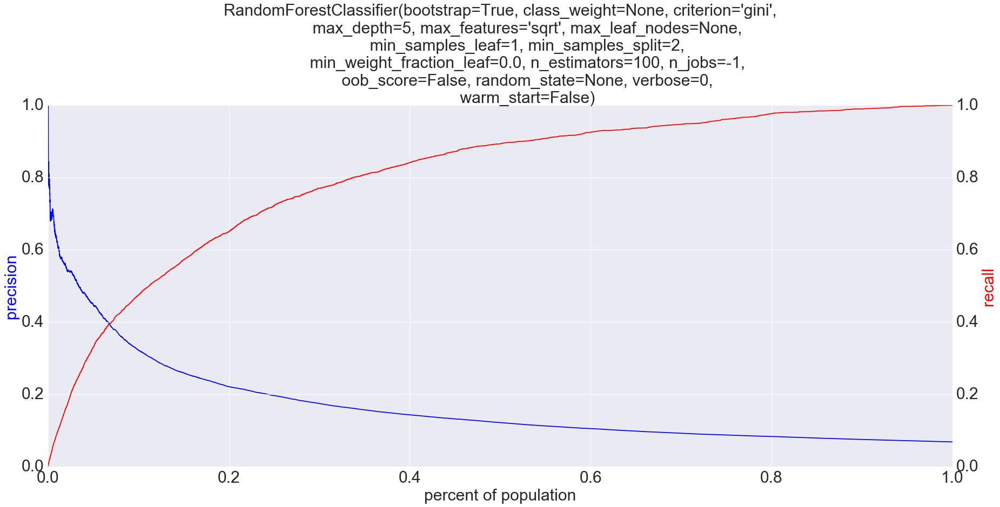

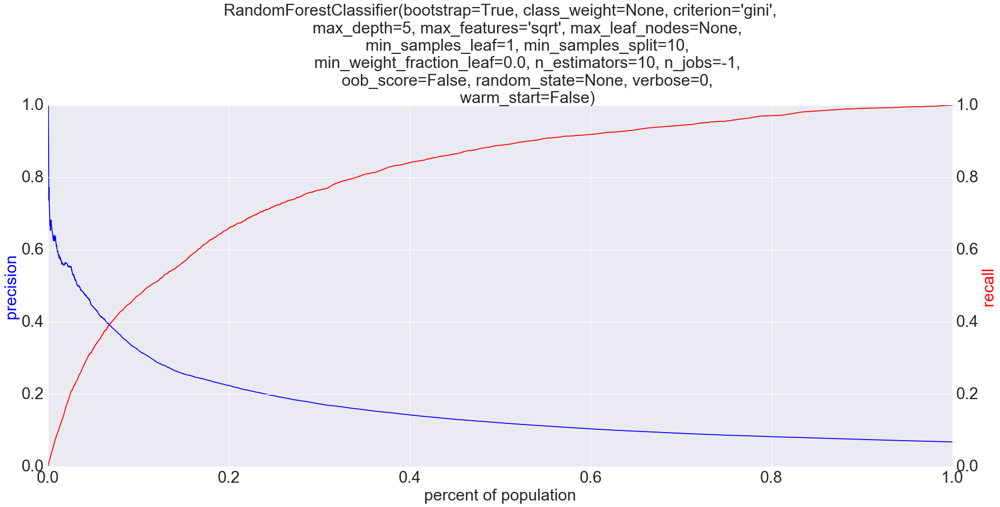

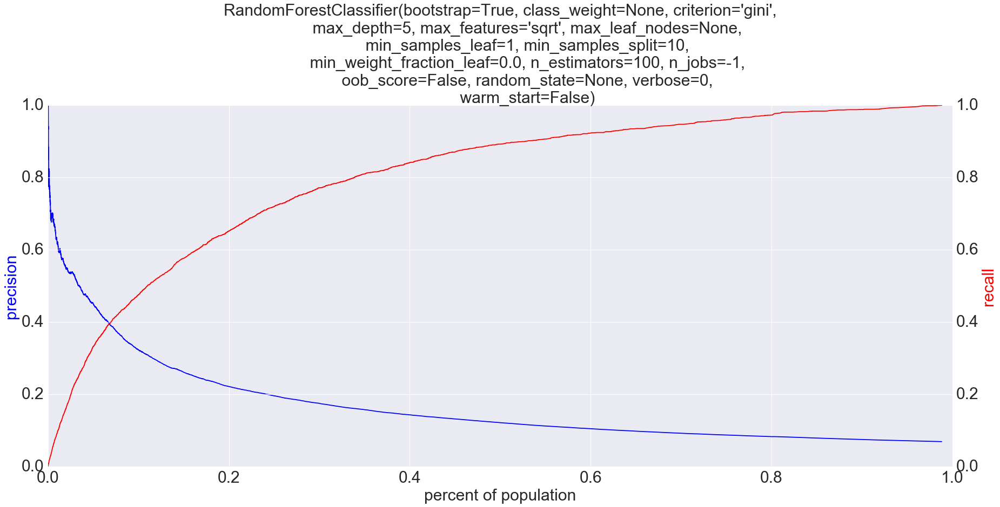

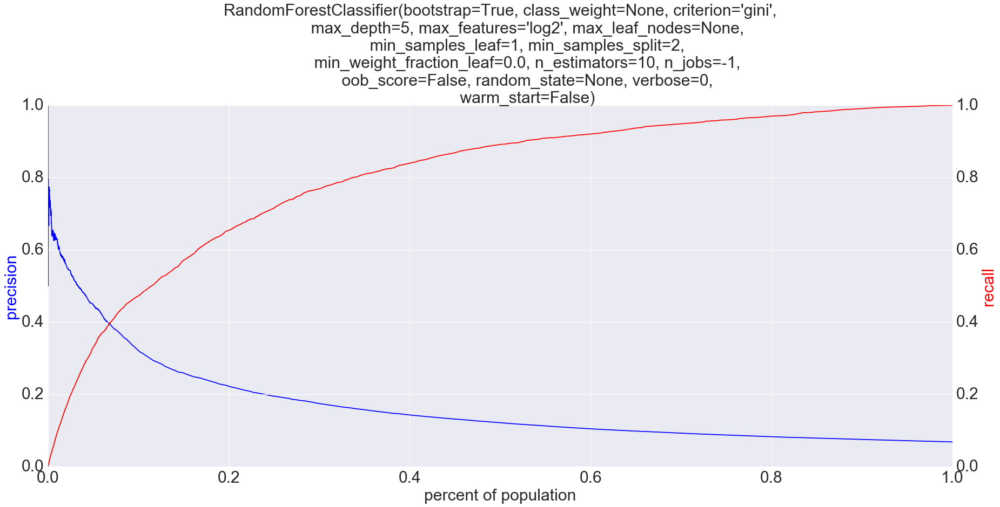

...

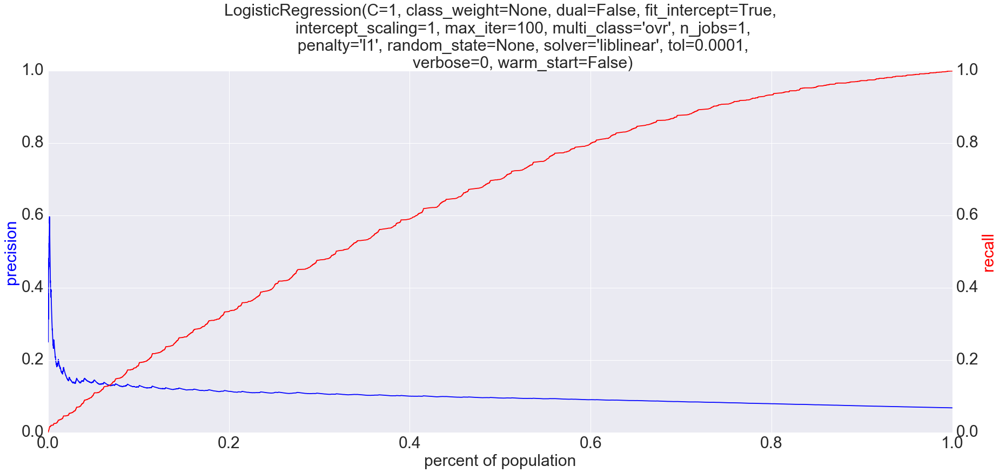

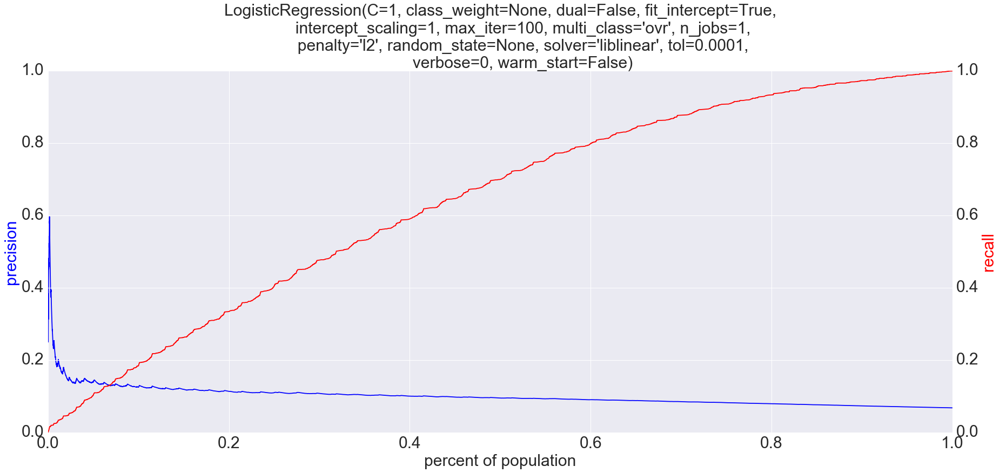

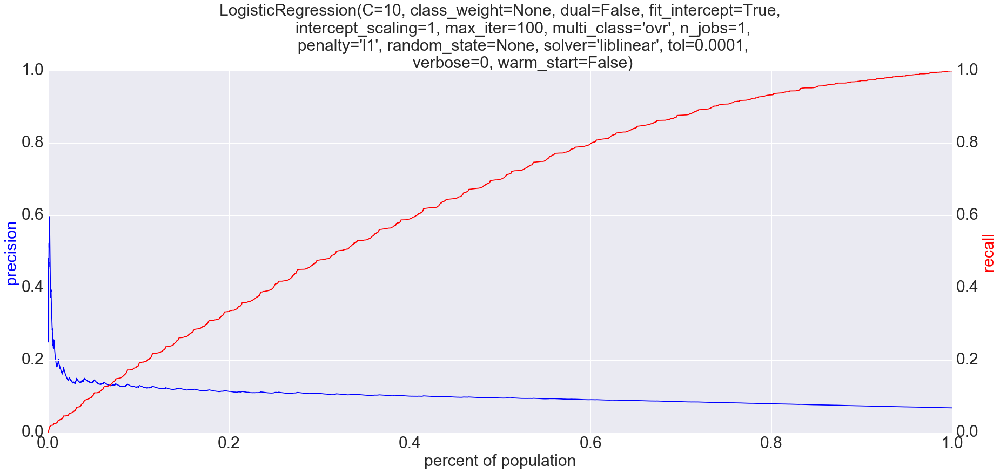

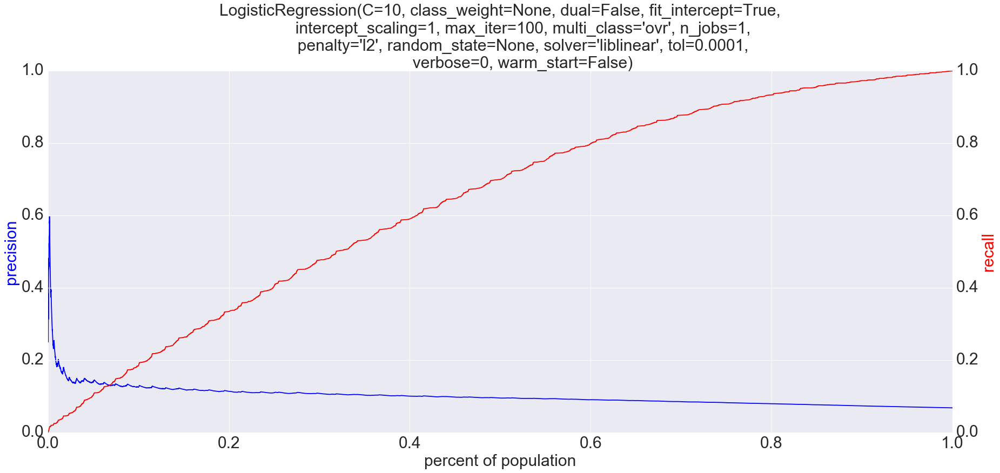

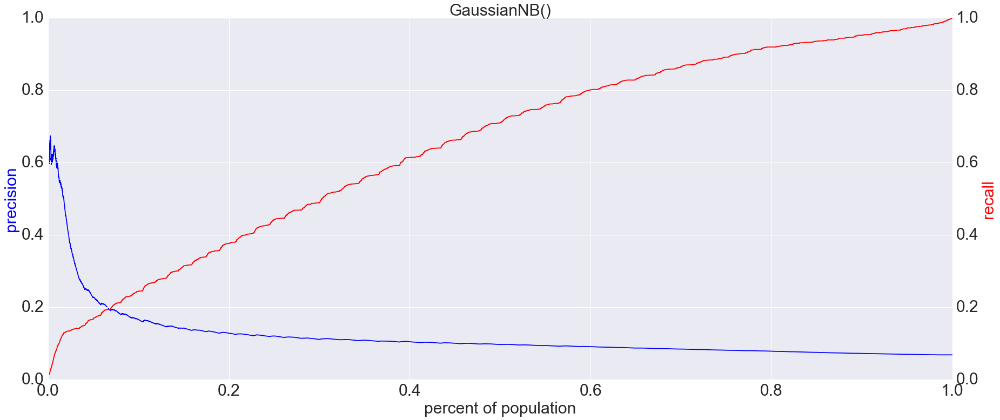

,model_type,clf,parameters,auc-roc,p_at_5,p_at_10,p_at_20
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.824621,0.451733,0.324533,0.223067
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 100, ...",0.827137,0.448000,0.322133,0.220800
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 10, 'n_estimators': 10, ...",0.825144,0.442667,0.324800,0.224000
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 10, 'n_estimators': 100,...",0.826851,0.450667,0.322667,0.221333
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.825831,0.448000,0.322133,0.222533
5,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 100, ...",0.826855,0.449600,0.322133,0.221600
6,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 10, 'n_estimators': 10, ...",0.823837,0.444800,0.322933,0.222533
7,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 10, 'n_estimators': 100,...",0.826765,0.449600,0.323200,0.221067
8,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.718175,0.379733,0.320800,0.215733
9,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 100, ...",0.774317,0.378133,0.287200,0.201467


In [81]:
clfs = clfs
grid = small_grid
models_to_run=['RF','DT','KNN', 'ET', 'AB', 'GB', 'LR', 'NB']
df = raw_df
features  =  ['RevolvingUtilizationOfUnsecuredLines', 'DebtRatio', 'age', 'NumberOfTimes90DaysLate']
X = df[features]
y = df.SeriousDlqin2yrs
results_df = clf_loop(models_to_run, clfs,grid, X,y)
results_df
#results_df.to_csv('results.csv', index=False)